# Segmentation + Colorization + ResNet50


*Code Writer: Chaeeun Ryu*

In [1]:
!nvidia-smi

Wed Mar 15 13:06:39 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:1D:00.0 Off |                  N/A |
| 30%   28C    P8    26W / 350W |  10854MiB / 24268MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA GeForce ...  On   | 00000000:1F:00.0 Off |                  N/A |
| 55%   

# Import Libraries

In [2]:
import argparse
import os
import random
import time
import warnings
import sys
import numpy as np
import torch
import torch.nn as nn 
import torchvision.transforms as transforms
from collections import Counter, OrderedDict
import torch.optim
from sklearn.metrics import confusion_matrix
from torchvision.datasets import OxfordIIITPet
import os
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR
import torchvision.models as models
import glob
import copy
# from torchvision.models import resnet50, ResNet50_Weights
import torchvision
import matplotlib.pyplot as plt
device =  torch.device('cuda:1')
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

In [3]:
device

device(type='cuda', index=1)

In [4]:
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  # type: ignore
    torch.backends.cudnn.deterministic = True  # type: ignore
    torch.backends.cudnn.benchmark = True  # type: ignore

# Config

In [5]:
from dataclasses import dataclass
@dataclass
class ARGS():
    LR = 0.0005
    EPOCHS = 300
    BATCHSIZE = 40
    MOMENTUM = 0.9
    WORKERS = 0
    WEIGHTDECAY = 0
    T_MAX = 150
    CLS_CLASS = 13
    SEG_CLASS = 3
    SIZE = 224
    SEED = 38
    
args = ARGS()

In [6]:
seed_everything(args.SEED)

# Get dataset

In [7]:
transform_train = transforms.Compose([
        transforms.Resize((args.SIZE,args.SIZE)),
        transforms.RandomCrop(args.SIZE, padding=4),
        transforms.RandomHorizontalFlip(),
        A.RandomBrightnessContrast(p=0.2),
        A.CLAHE(p=0.3),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])

transform_val = transforms.Compose([
        transforms.Resize((args.SIZE,args.SIZE)),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ])

In [8]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
_tr_transform = [
        A.Resize(height = args.SIZE, width = args.SIZE,p=1),
        A.ColorJitter(p=0.3),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ]
_val_transform = [
        A.Resize(height = args.SIZE, width = args.SIZE,p=1),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ]
to_tensor = A.Compose([ToTensorV2()])
seg_transform_train = A.Compose(_tr_transform)
seg_transform_val = A.Compose(_val_transform)

#### Datasets

In [9]:
classification_train_dataset = OxfordIIITPet(root='./data', split="trainval", target_types = 'category',download=True, transform=transform_train)
classification_val_dataset = OxfordIIITPet(root='./data', split="test", target_types = 'category',download=True, transform=transform_val)

In [10]:
_segmentation_train_dataset = OxfordIIITPet(root='./data', split="trainval", target_types = 'segmentation',download=True)
_segmentation_val_dataset = OxfordIIITPet(root='./data', split="test", target_types = 'segmentation', download=True)

In [11]:
from torch.utils.data import Dataset, DataLoader
class SegDataset(Dataset):
    def __init__(self, dataset, transform):
        self.tf = transform
        self.dataset = dataset
    
    def __len__(self):
        return self.dataset.__len__()
    
    def __getitem__(self, idx):
        img_tuple, mask_tuple = self.dataset.__getitem__(idx)
        sample = self.tf(image = np.array(img_tuple), mask= np.array(mask_tuple))
        img,mask = sample["image"],sample["mask"]
        return img,mask

In [12]:
segmentation_train_dataset = SegDataset(_segmentation_train_dataset,seg_transform_train)
segmentation_val_dataset = SegDataset(_segmentation_val_dataset,seg_transform_val)

In [13]:
len(classification_train_dataset.classes)

37

#### Dataloaders

In [14]:
global classification_loaders
classification_loaders = dict()
classification_train_loader = torch.utils.data.DataLoader(
            classification_train_dataset, batch_size=args.BATCHSIZE, shuffle=True,
            num_workers=args.WORKERS, pin_memory=True)
classification_val_loader = torch.utils.data.DataLoader(
    classification_val_dataset, batch_size=args.BATCHSIZE, shuffle=False,
    num_workers=args.WORKERS, pin_memory=True)

classification_loaders['train_loader'] = classification_train_loader
classification_loaders['val_loader'] = classification_val_loader

In [15]:
global segmentation_loaders
segmentation_loaders = dict()

segmentation_train_loader = torch.utils.data.DataLoader(
            segmentation_train_dataset, batch_size=args.BATCHSIZE, shuffle=True,
            num_workers=args.WORKERS, pin_memory=True)
segmentation_val_loader = torch.utils.data.DataLoader(
    segmentation_val_dataset, batch_size=args.BATCHSIZE, shuffle=False,
    num_workers=args.WORKERS, pin_memory=True)

segmentation_loaders['train_loader'] = segmentation_train_loader
segmentation_loaders['val_loader'] = segmentation_val_loader

In [16]:
img_batch, label_batch = next(iter(segmentation_train_loader))

In [17]:
aux_tr = transforms.Grayscale()

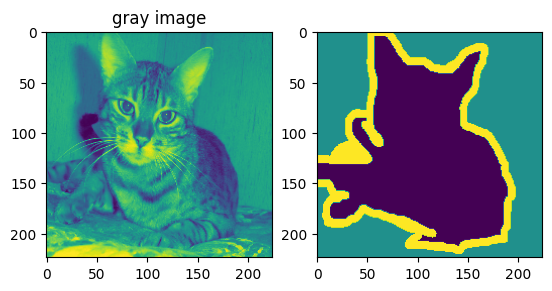

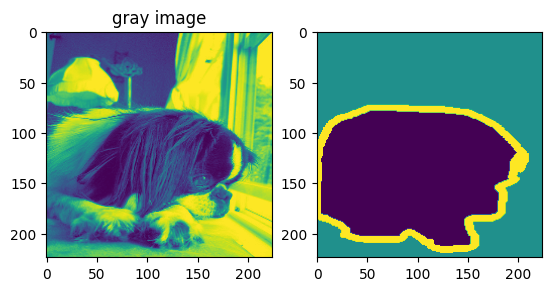

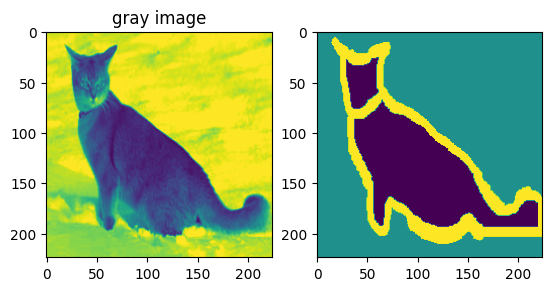

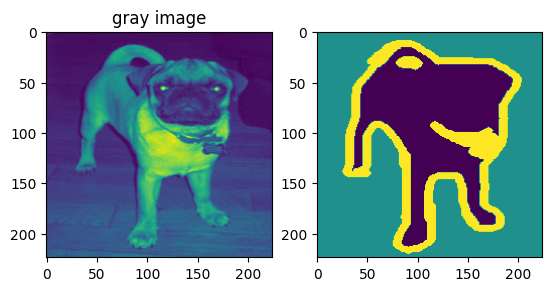

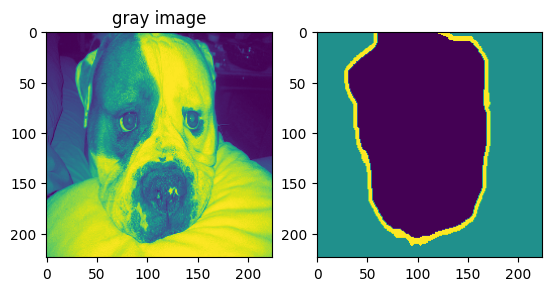

...

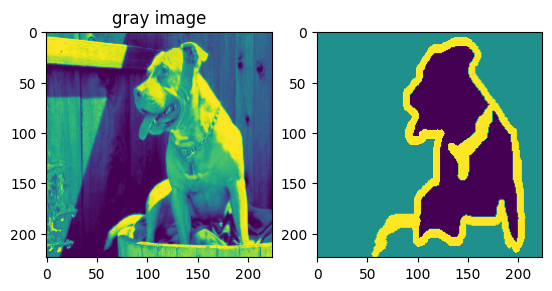

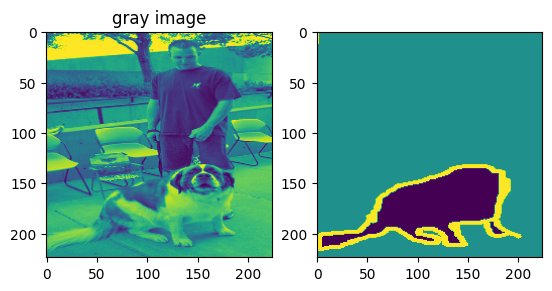

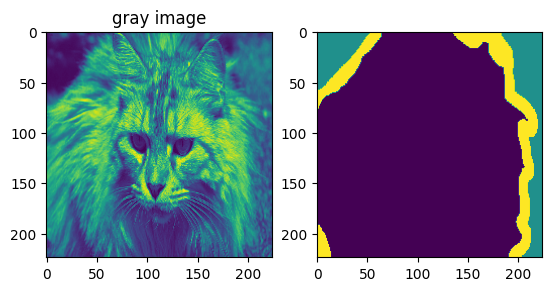

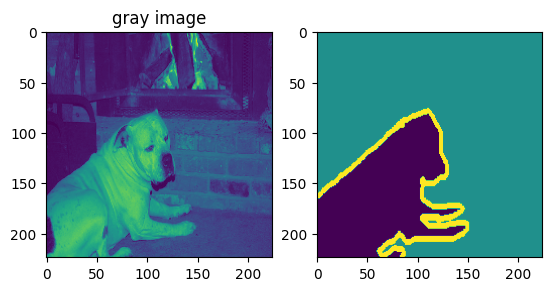

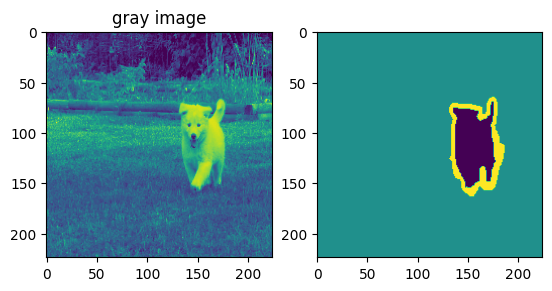

In [18]:
count,cur_count = 5,0

for image, mask in segmentation_loaders['train_loader']:
        image,mask = image.to(device), mask.to(device)
#         image,mask,rot_label = encode_ss(image,mask)
        image = aux_tr(image)
        cur_count+=1
        if cur_count>count:
            break
        for idx in range(args.BATCHSIZE):
            plt.subplot(121)
#             plt.title(f"rot label:{rot_label[idx].item()}")
            plt.title("gray image")
            plt.imshow(image[idx].permute(1,2,0).cpu().numpy())
            plt.subplot(122)
            plt.imshow(mask[idx].cpu().numpy())
            plt.show()
        break

### Utils

In [19]:
import torch
def soft_dice_score(
    output: torch.Tensor,
    target: torch.Tensor,
    smooth: float = 0.0,
    eps: float = 1e-7,
    dims=None,
) -> torch.Tensor:
    assert output.size() == target.size()
    if dims is not None:
        intersection = torch.sum(output * target, dim=dims)
        cardinality = torch.sum(output + target, dim=dims)
    else:
        intersection = torch.sum(output * target)
        cardinality = torch.sum(output + target)
    dice_score = (2.0 * intersection + smooth) / (cardinality + smooth).clamp_min(eps)
    return dice_score

In [20]:
def multiclass_dice_score(pred,mask):
    #storage
    class_dice = dict()
    #calculate dice per batch
    for class_ in range(1,args.SEG_CLASS+1):
        if torch.sum((pred == class_)*1) == 0 and torch.sum((mask == class_)*1) == 0:
            pass
        else:
            pred_ = (pred==class_)*1
            label_ = (mask==class_)*1
            dice = soft_dice_score(pred_,label_)
            class_dice[class_] = dice.item()
    return class_dice

In [21]:
from segmentation_models_pytorch.losses import FocalLoss
# from segmentation_models_pytorch.losses import |
criterion = FocalLoss(mode='multiclass')

# What if you train a classifier with a self-supervision task

In [22]:
from segmentation_models_pytorch.losses import FocalLoss
# from segmentation_models_pytorch.losses import |
seg_criterion = FocalLoss(mode='multiclass').to(device)
cls_criterion =None

# Define aux task: colorization

### Rgb -> decimal equation


**(r * 256 * 256) + (g * 256) + b**

In [23]:
def encode_ss(images,device = device):#self-supervision method
    aux_tr = transforms.Grayscale()
    gray_images = aux_tr(images)
    color_label = (255*255*images[:,0,:,:]+255*images[:,1,:,:]+images[:,2,:,:]).unsqueeze(1)
    gray_images = torch.cat((gray_images,gray_images,gray_images),1)
    return images, gray_images.to(device),color_label.to(device)

### Count number of parameters

In [24]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Viz


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


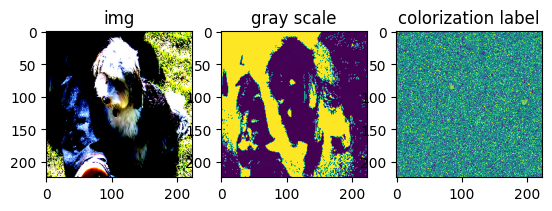

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


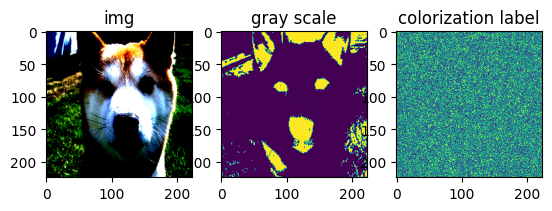

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


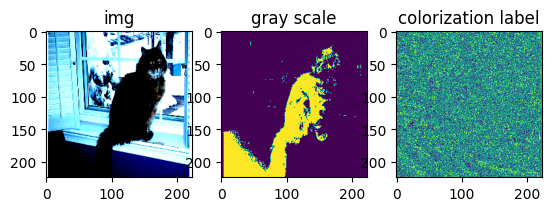

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


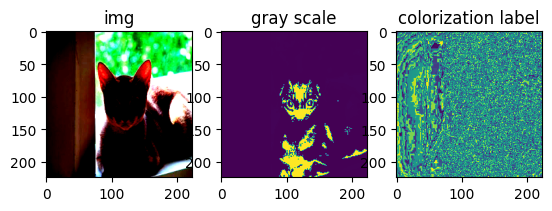

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


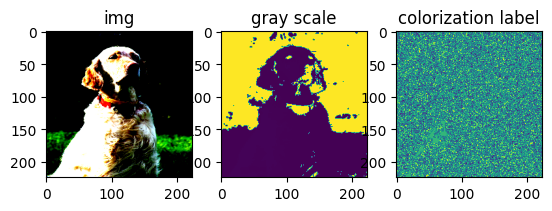

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


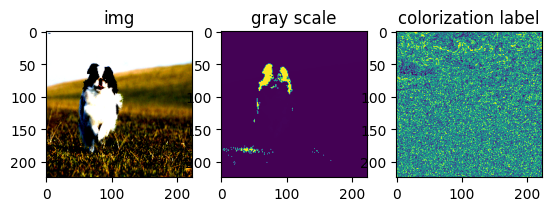

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


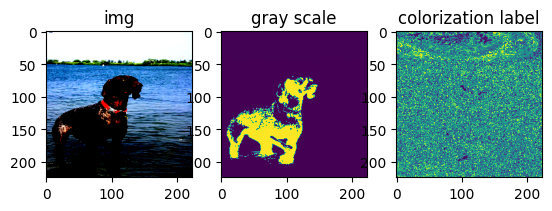

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


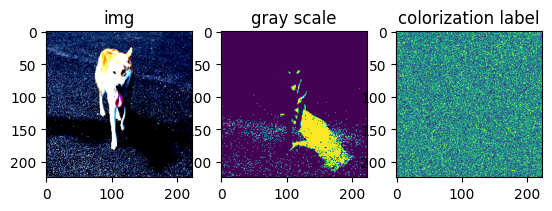

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


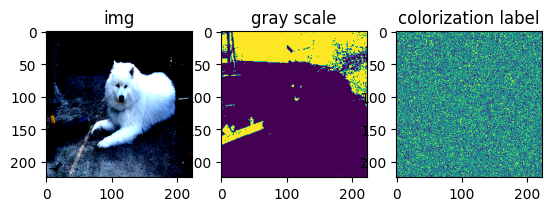

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


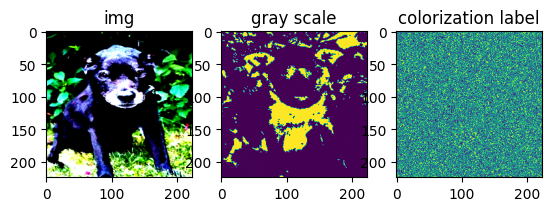

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


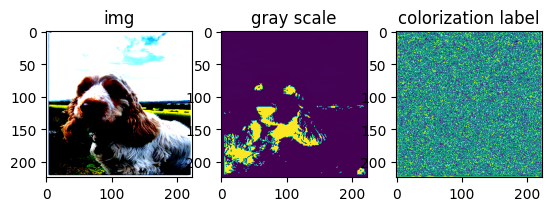

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


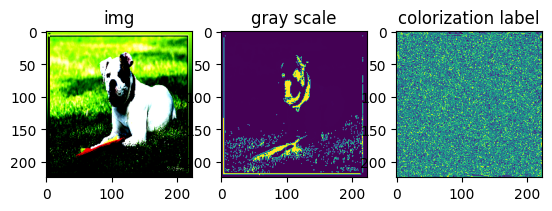

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


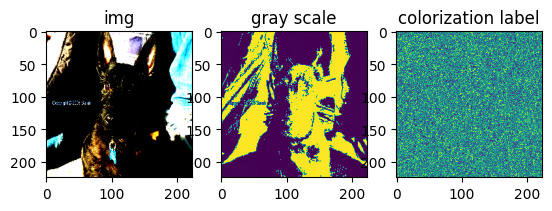

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


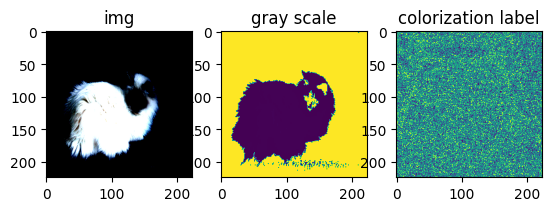

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


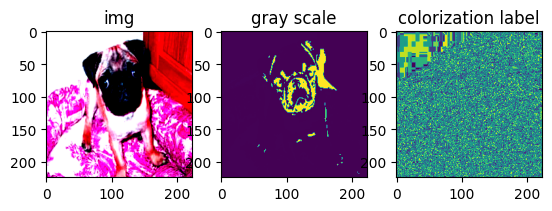

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


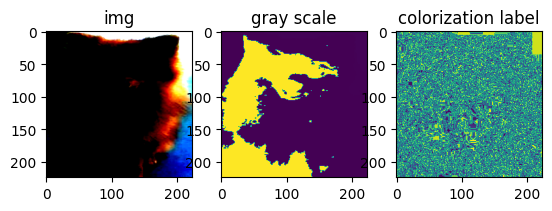

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


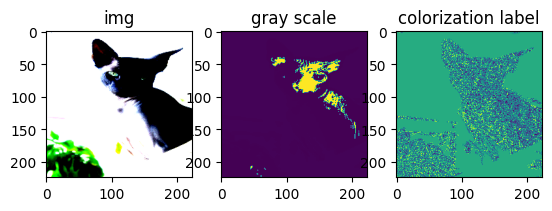

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


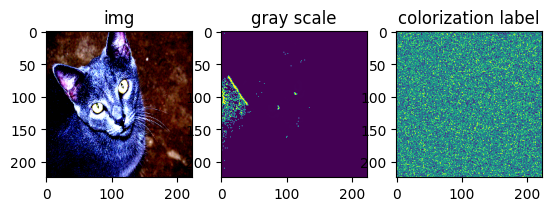

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


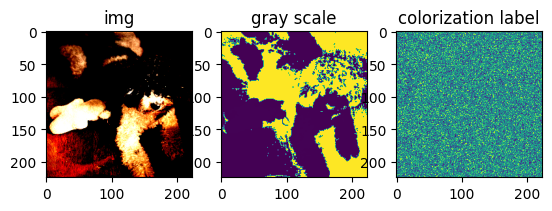

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


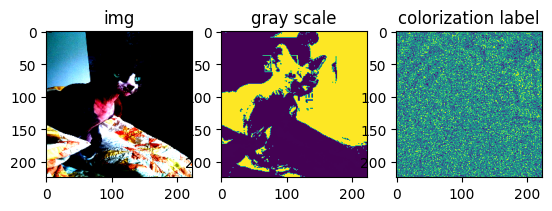

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


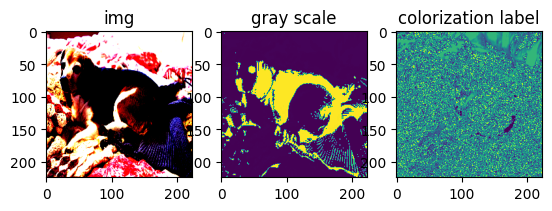

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


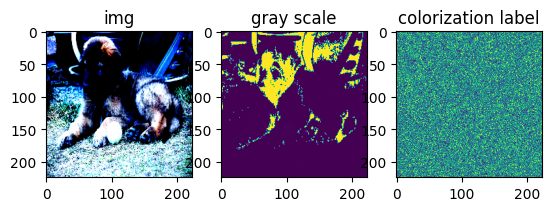

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


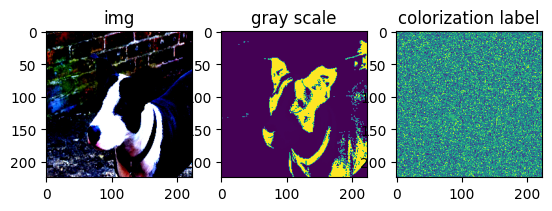

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


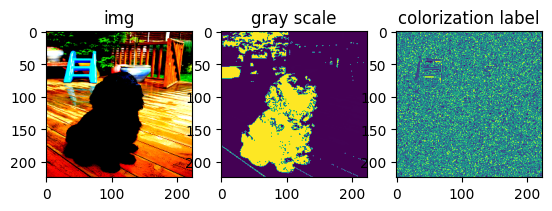

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


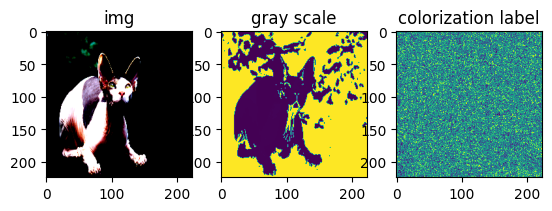

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


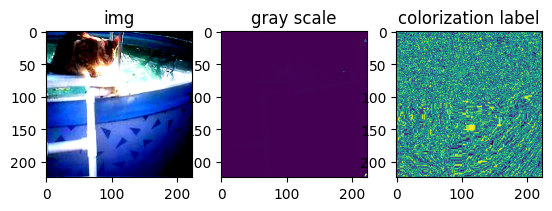

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


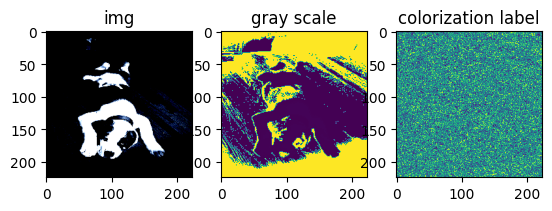

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


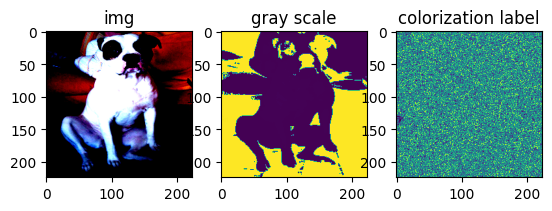

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


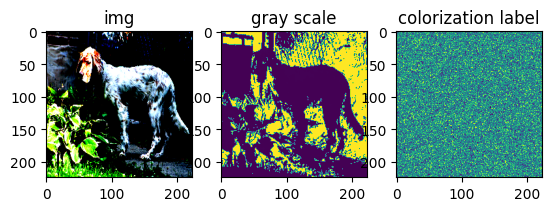

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


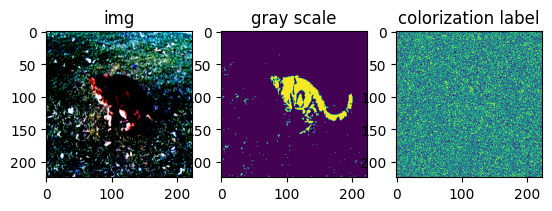

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


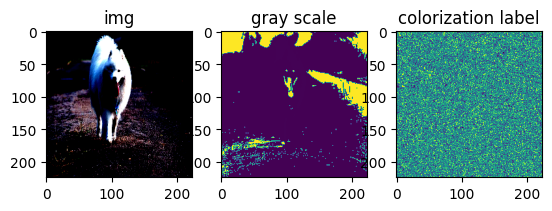

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


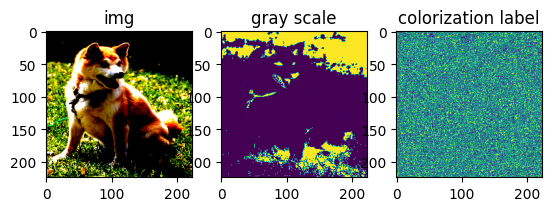

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


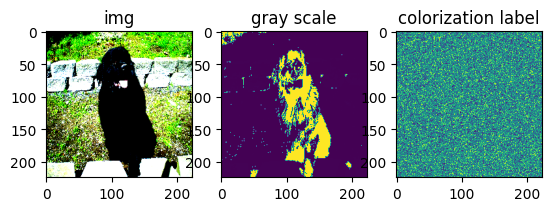

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


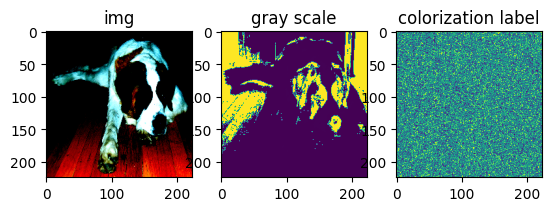

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


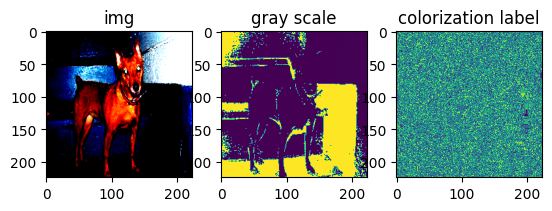

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


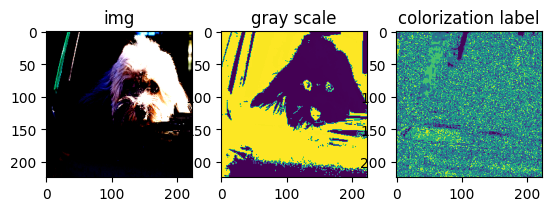

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


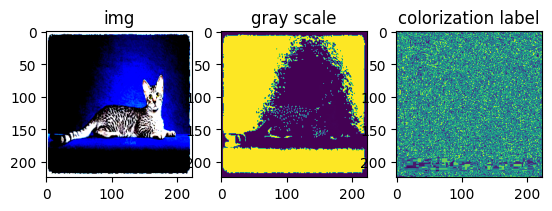

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


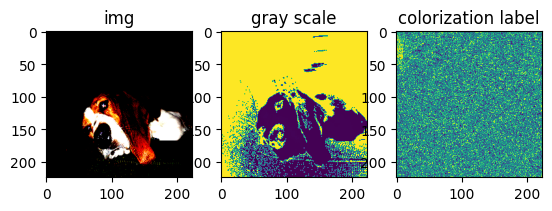

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


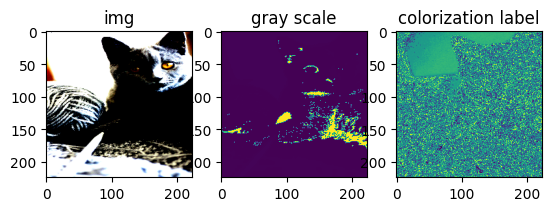

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


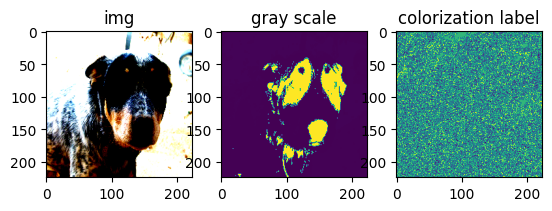

In [25]:
for image, mask in segmentation_loaders['train_loader']:
        image,mask = image.to(device), mask.to(device)
        image,mask,rot_label = encode_ss(image,mask)
        for idx in range(args.BATCHSIZE):
            plt.subplot(131)
            plt.title(f"img")
            plt.imshow(image[idx].permute(1,2,0).cpu().numpy())
            plt.subplot(132)
            plt.title("gray scale")
            plt.imshow(mask[idx][0].cpu().numpy())
            plt.subplot(133)
            plt.title("colorization label")
            plt.imshow(rot_label[idx][0].cpu().numpy())
            plt.show()
        break

In [26]:
mask.size()

torch.Size([40, 3, 224, 224])

# Criterion

In [27]:
def LossPredLoss(input, target, margin=1.0, reduction='mean'):
#     mse_loss = nn.MSELoss()
    assert len(input) % 2 == 0, 'the batch size is not even.'
    assert input.shape == input.flip(0).shape
    #print(f"original batch size: {len(input)}"): 8
    input = (input - input.flip(0))[:len(input)//2] # [l_1 - l_2B, l_2 - l_2B-1, ... , l_B - l_B+1], where batch_size = 2B
    target = (target - target.flip(0))[:len(target)//2]
    target = target.detach()
    #print(f"new size: {len(input)}"): 4
    one = 2 * torch.sign(torch.clamp(target, min=0)) - 1 # 1 operation which is defined by the authors
    
    if reduction == 'mean':
        loss = torch.sum(torch.clamp(margin - one * input, min=0))
        loss = loss / input.size(0) # Note that the size of input is already halved
    elif reduction == 'none':
        loss = torch.clamp(margin - one * input, min=0)
    else:
        NotImplementedError()
    
    return loss

In [28]:
def ColorLoss(input_batch,target_batch):
    assert len(input_batch) == len(target_batch)
    n_iter = len(input_batch)
    loss = None
    for idx in range(n_iter):
        if loss == None:
            loss = LossPredLoss(input_batch[idx].flatten(),target_batch[idx].flatten())
        else:
            loss += LossPredLoss(input_batch[idx].flatten(),target_batch[idx].flatten())
    return loss/n_iter

# Synchronous learning: Segmentation + Classification

In [29]:
import segmentation_models_pytorch as smp

unet50 = smp.Unet(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=4,                      # model output channels (number of classes in your dataset)
)
unet50.to(device)

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

In [30]:
class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()
        
    def forward(self, x):
        return x

In [31]:
class ModifiedNet(nn.Module):
    def __init__(self,unet50):
        super(ModifiedNet, self).__init__()
        unet50.segmentation_head = Identity()
        self.model = unet50
        self.backbone_segmentation_head = nn.Conv2d(in_channels=16,out_channels=4,kernel_size=(3,3),stride=(1,1),padding=(1,1))
        self.color_segmentation_head = nn.Conv2d(in_channels=16,out_channels=1,kernel_size=(3,3),stride=(1,1),padding=(1,1))
        
    def forward(self,image_batch,gray_image_batch):
        self.model.segmentation_head = Identity()
        decoder_out = self.model(image_batch)
        logits = self.backbone_segmentation_head(decoder_out)
        
        gray_decoder_out = self.model(gray_image_batch)
        surrogate_out = self.color_segmentation_head(gray_decoder_out)
        return logits, surrogate_out

In [32]:
unet50#.segmentation_head()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

In [33]:
ch_unet = ModifiedNet(unet50)
ch_unet.to(device)

ModifiedNet(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(in

In [34]:
def train_seg_ss(epoch,train_loader,model,seg_criterion, optimizer, device=device, cls_criterion = cls_criterion):
    losses = []
    ss_losses = []
    save_ss_acc = []
    train_dice_dict = dict()
    model.to(device)
    model.train()
    
    for image, mask in train_loader:
        image,mask = image.to(device), mask.to(device)
        #images, gray_images.to(device),color_label.to(device)
        image,gray_images,color_label = encode_ss(image)
        logits,surrogate_out = model(image,gray_images)
        preds = torch.argmax(logits, axis = 1)
#         surrogate_pred = torch.argmax(surrogate_out,axis = 1)
        seg_loss = seg_criterion(logits,mask)
        reg_loss = ColorLoss(surrogate_out, color_label)
        weight = 1
        loss = weight*reg_loss + seg_loss
        dice_dict = multiclass_dice_score(preds,mask)
        losses.append(seg_loss.item())
        ss_losses.append(reg_loss.item())
#         acc1 = (torch.sum((surrogate_pred==color_label)*1)/len(surrogate_pred)).item()
#         save_ss_acc.append(acc1)
        
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        
        for key in dice_dict.keys():
            if key in train_dice_dict:
                train_dice_dict[key].append(dice_dict[key])
            else:
                train_dice_dict[key] = [dice_dict[key]]
    
    #average dice dict
    for key in train_dice_dict.keys():
        train_dice_dict[key] = np.mean(train_dice_dict[key])
    return np.mean(losses), train_dice_dict, np.mean(ss_losses)

In [35]:
def eval_seg_ss(val_loader, model, seg_criterion, device, cls_criterion = cls_criterion):
    losses = []
    ss_losses = [] 
    ss_acc = []
    val_dice_dict = dict()        
    model.eval()
    
    with torch.no_grad():
        for image, mask in val_loader:
            image,mask = image.to(device),mask.to(device)
            image,gray_images,color_label = encode_ss(image)
            logits,surrogate_out = model(image,gray_images)
            preds = torch.argmax(logits, axis = 1).to(torch.float64)
#             surrogate_pred = torch.argmax(surrogate_out, axis = 1)
#             acc1 = (torch.sum((surrogate_pred==color_label)*1)/len(surrogate_pred)).item()
#             ss_acc.append(acc1)
            seg_loss = seg_criterion(logits,mask)
            reg_loss = ColorLoss(surrogate_out,color_label)
            loss = seg_loss+reg_loss
            dice_dict = multiclass_dice_score(preds,mask)
            losses.append(seg_loss.item())
            ss_losses.append(reg_loss.item())
            
            for key in dice_dict.keys():
                if key in val_dice_dict:
                    val_dice_dict[key].append(dice_dict[key])
                else:
                    val_dice_dict[key] = [dice_dict[key]]
    #average dice dict
    for key in val_dice_dict.keys():
        val_dice_dict[key] = np.mean(val_dice_dict[key])
    return np.mean(losses), val_dice_dict,np.mean(ss_losses)

In [36]:
from segmentation_models_pytorch.losses import FocalLoss
# from segmentation_models_pytorch.losses import |
seg_criterion = FocalLoss(mode='multiclass').to(device)
cls_criterion = None

In [37]:
ch_unet_optimizer = torch.optim.SGD(ch_unet.parameters(), args.LR,
                            momentum=args.MOMENTUM,
                            weight_decay=args.WEIGHTDECAY)
ch_unet_scheduler = CosineAnnealingLR(ch_unet_optimizer, T_max = args.T_MAX)

In [ ]:
from tqdm.notebook import tqdm
save_train_loss = []
save_train_dice =[]
save_val_loss = []
save_val_dice = []

save_ss_train_loss = []
save_ss_val_loss = []
save_ss_train_acc = []
save_ss_val_acc = []

best_val_dice = 0.
ss_best_val_acc = 0.
max_patience = 15
ch_unet.to(device)

print("training starting..")

for epoch in tqdm(range(args.EPOCHS)):
    train_loss, train_dice,ss_train_loss = train_seg_ss(epoch,segmentation_loaders['train_loader'], ch_unet, seg_criterion, ch_unet_optimizer,device, cls_criterion)
    val_loss, val_dice,ss_val_loss = eval_seg_ss(segmentation_loaders['val_loader'], ch_unet, seg_criterion, device, cls_criterion)
    avg_train_dice, avg_val_dice = np.mean(list(train_dice.values())),np.mean(list(val_dice.values()))
    save_train_dice.append(avg_train_dice)
    save_val_dice.append(avg_val_dice)
    save_train_loss.append(train_loss)
    save_val_loss.append(val_loss)
    
    #self-supervision
    save_ss_train_loss.append(ss_train_loss)
#     save_ss_train_acc.append(ss_train_acc)
    save_ss_val_loss.append(ss_val_loss)
#     save_ss_val_acc.append(ss_val_acc)
    
    print(f"======= epoch {epoch} ========")
    print("ss train loss:",ss_train_loss, "ss val loss:",ss_val_loss)
    print("train dice:",train_dice)
    print("val dice:",val_dice)
    print(f"focal loss || train: {train_loss} val: {val_loss}")
    
    if avg_val_dice > best_val_dice:
        print("model updated at epoch:",epoch,"avg val dice:",avg_val_dice)
        best_model = copy.deepcopy(ch_unet)
        best_val_dice = avg_val_dice
        best_val_dice_dict = val_dice
        patience = 0
    else:
        patience +=1
    
    if patience > max_patience:
        print("patience overloaded..! stop learning.........")
        break
    ch_unet_scheduler.step()

#지금까지 high score: 0.87

training starting..


  0%|          | 0/300 [00:00<?, ?it/s]

======= epoch 0 ========
ss train loss: 0.6935401105362436 ss val loss: 0.5829960739483004
train dice: {1: 0.3755370932428733, 2: 0.6886275086713873, 3: 0.08708677258666443}
val dice: {1: 0.45299461775499844, 2: 0.768141037096148, 3: 0.02302803624542835}
focal loss || train: 0.530860806936803 val: 0.4309792045665824
model updated at epoch: 0 avg val dice: 0.41472123036552494
======= epoch 1 ========
ss train loss: 0.443287604852863 ss val loss: 0.4600749790020611
train dice: {1: 0.5442822413600009, 2: 0.7978982964287633, 3: 0.014978519003109439}
val dice: {1: 0.6252218701917193, 2: 0.8137109091748362, 3: 0.007766427669633666}
focal loss || train: 0.3883207524600236 val: 0.36277567595243454
model updated at epoch: 1 avg val dice: 0.4822330690120631
======= epoch 2 ========
ss train loss: 0.38066580049369647 ss val loss: 0.4086819819134215
train dice: {1: 0.6817713509435239, 2: 0.8363060698561047, 3: 0.007623237927201326}
val dice: {1: 0.7230132883009703, 2: 0.8490919542053471, 3: 0.0056

In [ ]:
log_dict = dict()
log_dict['save_train_loss'] = save_train_loss
log_dict['save_val_loss'] = save_val_loss
log_dict['save_train_dice'] = save_train_dice
log_dict['save_val_dice'] = save_val_dice
log_dict['save_ss_train_acc'] = save_ss_train_acc
log_dict['save_ss_val_acc'] = save_ss_val_acc
log_dict['save_ss_train_loss'] = save_ss_train_loss
log_dict['save_ss_val_loss'] = save_ss_val_loss

In [ ]:
torch.save(log_dict,"./resnet50_segmentation_ss_log.pt")

In [ ]:
torch.save({"model_w":ch_unet.state_dict(),"best_model_w":best_model.state_dict()},"./resnet50_segmentation_ss.pt")

In [ ]:
plt.title("Saved loss for ss (ResNet50)")
plt.plot(save_ss_train_loss,label = "train loss")
plt.plot(save_ss_val_loss, label = "valid loss")
plt.legend()
plt.show()

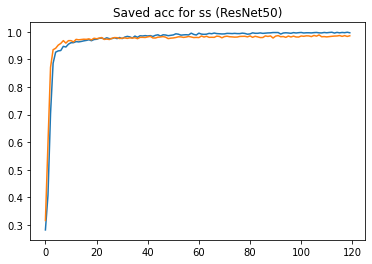

In [36]:
plt.title("Saved acc for ss (ResNet50)")
plt.plot(save_ss_train_acc,label = "train")
plt.plot(save_ss_val_acc,label = "valid")
plt.show()

In [4]:
unet_ckpt= torch.load('./orig_unet.pt')
unet_ckpt.keys()
resnet50 = torch.load('./resnet50_segmentation_ss_log.pt')
unet_lorot = torch.load('./lorot_segmentation.pt')

In [6]:
unet_lorot.keys()

dict_keys(['save_train_loss', 'save_val_loss', 'save_train_dice', 'save_val_dice', 'save_ss_train_acc', 'save_ss_val_acc', 'save_ss_train_loss', 'save_ss_val_loss'])

In [5]:
resnet50.keys()

dict_keys(['save_train_loss', 'save_val_loss', 'save_train_dice', 'save_val_dice', 'save_ss_train_acc', 'save_ss_val_acc', 'save_ss_train_loss', 'save_ss_val_loss'])

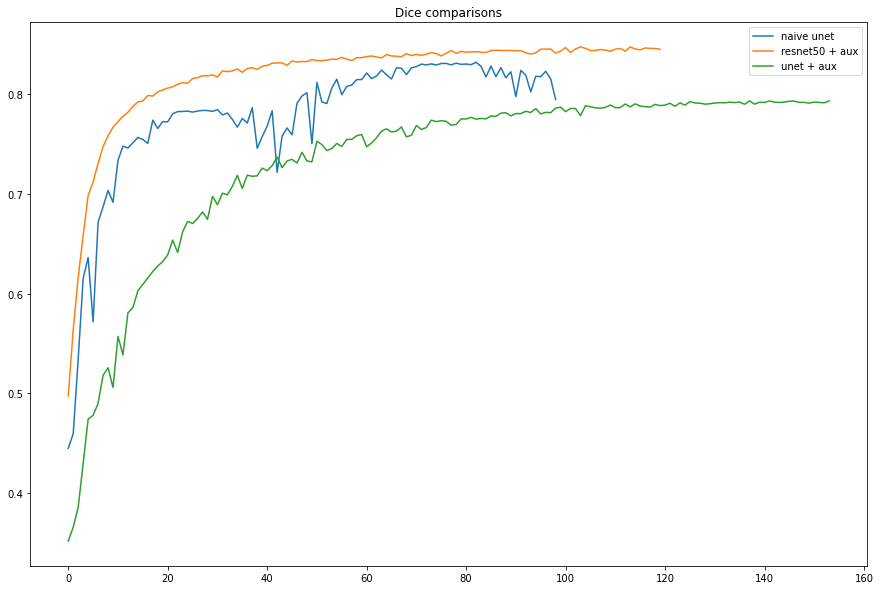

In [12]:
plt.figure(figsize = (15,10))
plt.title("Dice comparisons")
#plt.plot(unet_ckpt['save_train_dice'],label = "train dice with unet")
plt.plot(unet_ckpt['save_val_dice'],label = "naive unet")
plt.plot(resnet50['save_val_dice'],label = "resnet50 + aux")
plt.plot(unet_lorot['save_val_dice'],label = "unet + aux")
plt.legend()
plt.show()